# MCDA for wine quality dataset

## Data analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('WineQT.csv', index_col=-1)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [192]:
from ydata_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
df.duplicated().sum() #! Do we need this? Pandas profiling is already showing this. The other aspect is that they show different values but this is not important probably.

125

In [38]:
df.drop_duplicates(keep='first', inplace=True)
#Interesting discussion on whether to drop duplicates or not https://indicodata.ai/blog/should-we-remove-duplicates-ask-slater/

In [ ]:
df.count() #! Do we need this? Pandas profiling would show this as well.

fixed acidity           1018
volatile acidity        1018
citric acid             1018
residual sugar          1018
chlorides               1018
free sulfur dioxide     1018
total sulfur dioxide    1018
density                 1018
pH                      1018
sulphates               1018
alcohol                 1018
quality                 1018
dtype: int64

The data seems to be balanced enough. The only column that takes correlation values around (-)0.7 is the fixed acidity, so if the models peforms poorly I'll think about removing it.


SC: I'd write a short summary about pandas profiling results here and general short description of the dataset. Moreover I'd point out that Partial Dependency Plots `ASSUMES` no correlation between variables so we should look very carefully on the results of PDP on correlated variables. Maybe few word on distributions, that some looks like a normal ones. That potentially there may be some outliers but we don't know from where they come from so we decided not to remove them etc. Moreover in the task description there is a point `Briefly describe the data set including the criteria descriptions.` So every attribute should be described what it means. This knowledge is very useful. 


In [40]:
df['score'] = df['quality'].apply(lambda x: 'good' if x > 5 else 'bad')
df.drop('quality', axis=1, inplace=True)

In [41]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,score
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,good
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,bad


In [ ]:
df.to_csv('WineQT_cleaned.csv') # Be consistent about using it. XGBooost you uses df defined above and in the other models you use from_csv and read this file

## First model - XGBoost

In [6]:
# XGBoost Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

X = df.drop('score', axis=1)
y = df['score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#! Important I wouldn't use any data transformations if they are not necessary. Decision trees are not sensitive to the scale of the features.
#! And it is much easier for a homan to interpret the results if the features are not transformed anyway.
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

le = LabelEncoder() #In this case this is not a probleem but I'd rather use it on the entire y once
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [44]:
features = X.columns
features_map = dict(zip(features, range(len(features))))
reversed_map = {features_map[x]: x for x in features_map.keys()}

In [45]:
params = {
    "max_depth": len(features) * 2, #! Personally I think this value is much too big we have 12 features so depth possibly can be 24
    "eta": 0.1,
    "nthread": 2,
    "seed": 0,
    "eval_metric": "rmse",
    "monotone_constraints": "(" + ",".join(["1"] * len(features)) + ")", #! Have you just copied it or thought about it?
    #! Because now you say that for every feature function should be stricly increasing how do you deduced it?
    #! We can e.g. use a linear model, look what weights it gives to the features and then use sign of these weights as a monotonocity constraint
    "n_estimators": 1,
}

In [46]:
model = XGBClassifier(**params)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('Accuracy Score: ', round(accuracy_score(y_test, y_pred), 4))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
print('Classification Report: \n', classification_report(y_test, y_pred))



Accuracy Score:  0.7108
Confusion Matrix: 
 [[74 24]
 [35 71]]
Classification Report: 
               precision    recall  f1-score   support

           0       0.68      0.76      0.71        98
           1       0.75      0.67      0.71       106

    accuracy                           0.71       204
   macro avg       0.71      0.71      0.71       204
weighted avg       0.71      0.71      0.71       204



In [47]:
booster = model.get_booster()
booster.feature_names = list(features)

In [48]:
from xgboost import plot_tree

<AxesSubplot: >

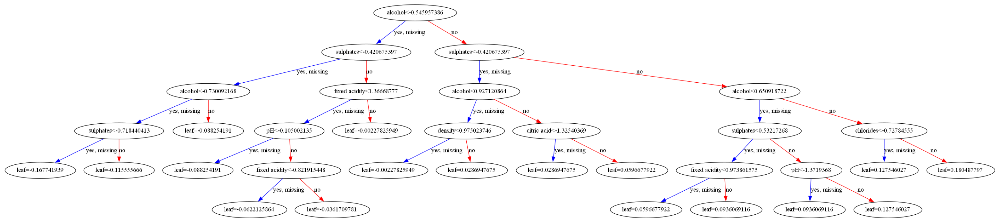

In [49]:
fig, ax = plt.subplots(figsize=(40, 20))
plot_tree(model, ax=ax, num_trees=0)

SC: Is this tree interpretable for you? Can you look at it and say. Yes I understand when Wine goes to preffered group and when it goes to not preffered? I'd try to do few experiments with different max depth and compare the results (both metrics and interpretability of resulting tree). 

In [50]:
fscores = booster.get_fscore()
fscores #! Explain what does it mean

{'fixed acidity': 3.0,
 'citric acid': 1.0,
 'chlorides': 1.0,
 'density': 1.0,
 'pH': 2.0,
 'sulphates': 4.0,
 'alcohol': 4.0}

In [51]:
score = booster.get_score(importance_type='gain')
score #! explain what does it mean

{'fixed acidity': 3.16068434715271,
 'citric acid': 0.08688068389892578,
 'chlorides': 0.5641326904296875,
 'density': 0.4143916368484497,
 'pH': 3.8327884674072266,
 'sulphates': 15.471819877624512,
 'alcohol': 42.25009536743164}

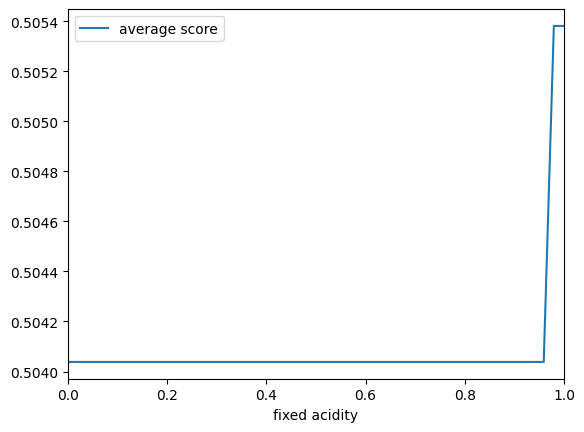

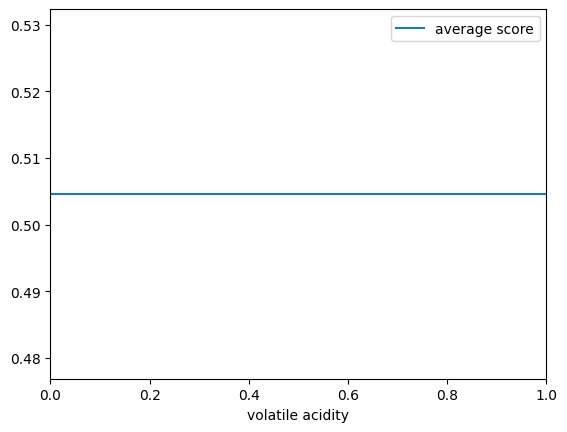

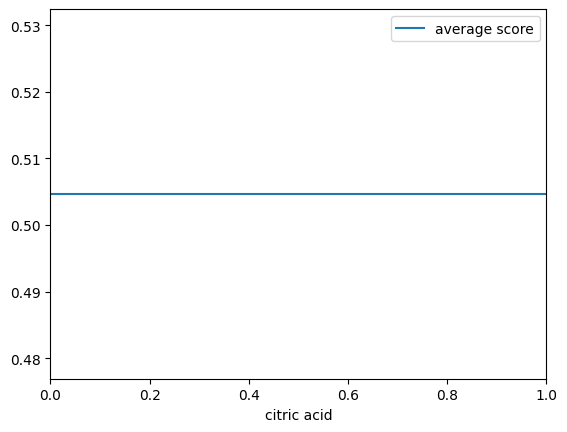

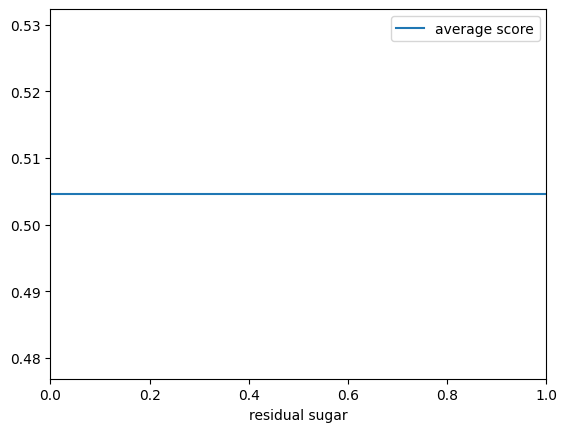

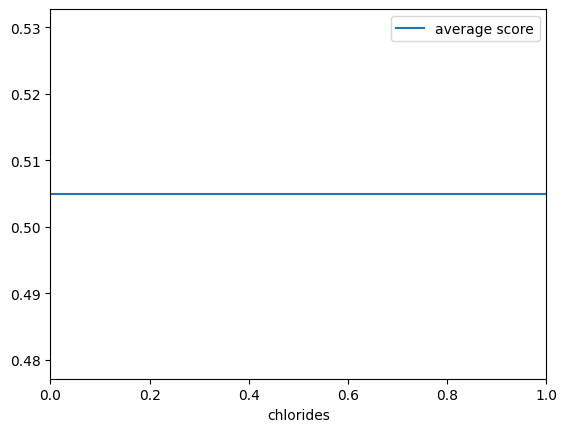

...

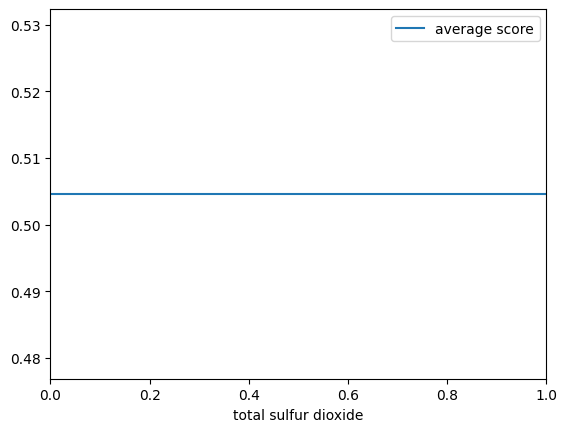

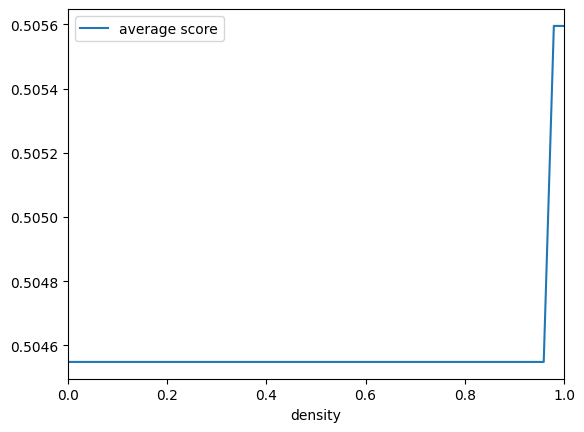

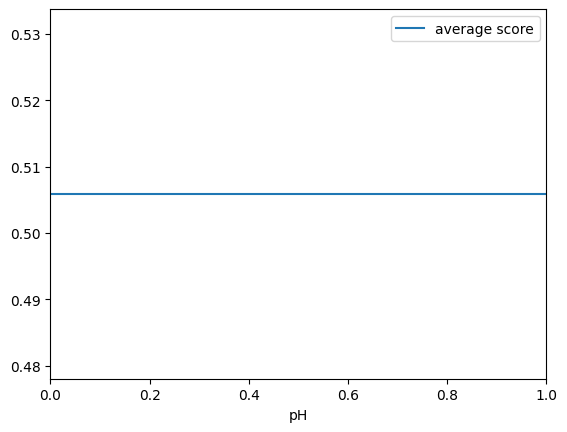

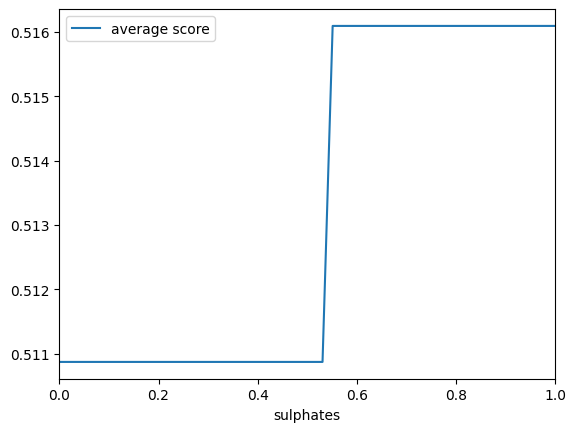

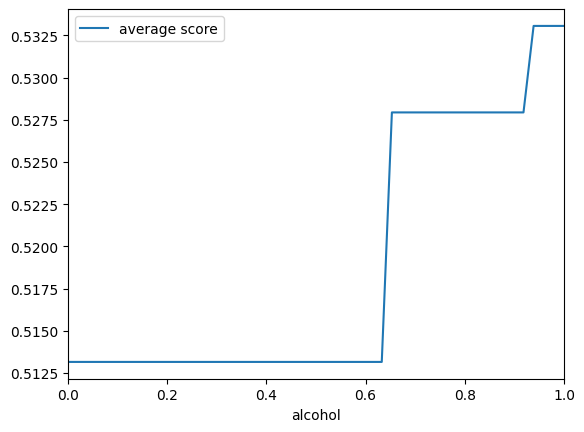

In [52]:
grid = np.linspace(0,1,50)
for c in range(len(features)):
    y_pred = np.zeros(len(grid))
    for i, val in enumerate(grid):
        X_temp = X_train.copy()
        X_temp[:, c] = val
        data = xgb.DMatrix( pd.DataFrame(X_temp), feature_names=features)
        y_pred[i] = np.average(booster.predict(data))
        
    fig, ax = plt.subplots()
    ax.plot(grid, y_pred,  label='average score')
    ax.set_xlim(0, 1)
    ax.set_xlabel(features[c])
    ax.legend()

SC: Explain what does it mean? You see PDP like this and what? For sure most of the attributes are not used. So do we need them? Maybe we should drop these attributes. Another issue is with monotonicity. You forced it to be increasing function and this may be the case why some attributes are not used. Moreover for two parameters the change is really small so it is also questionable if we need it. Maybe we need just alcohol and sulphates?

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


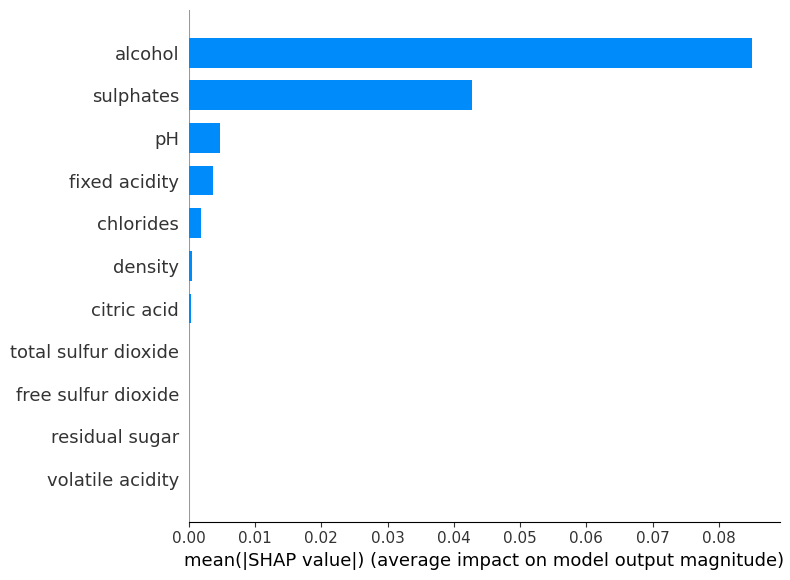

In [53]:
import shap

explainer = shap.TreeExplainer(model)
shape_values = explainer.shap_values(X_test)
shap.summary_plot(shape_values, X_test, plot_type="bar", feature_names=features)

TODO


- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).

`SC`: My idea to do it somehow analitically. Take every path from the tree and select only these that have wanted class. Iterate over all paths and calculate relative changes of attributes so that our example passes the test (go from top to bottom). `Now we need some normalization of attributes`. Then select the branch with minimal changes required and modifiy the example accordingly. In general this problem is known as finding counterfactual
and there is some article on medium describing it https://towardsdatascience.com/explaining-the-decisions-of-xgboost-models-using-counterfactual-examples-fd9c57c83062. btw. it was even covered by prof. Stefanowski on the Ethics lecture.

- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

Just verify approach above.

We also miss this one
- EExplain the predictions for these objects using at least one technique (Anchors LIME, SHAP, ... ) - `you` uses SHAP to explain global attributes importance but here the task is to do this for single objects.


## ANN Choquet integral

In [3]:
import torch.nn as nn
import torch.nn.functional as F
from helpers import *

class LinearGreaterThanZero(nn.Linear):
    def __init__(self, in_features, bias=False, min_w=0.0000001):
        super().__init__(in_features, 1, bias)
        self.is_bias = bias
        self.min_w = min_w
        if bias:
            nn.init.uniform_(self.bias, self.min_w, 1.0)
        else:
            self.bias = None

    def reset_parameters(self):
        nn.init.uniform_(self.weight, 0.1, 1.0)

    def w(self):
        with torch.no_grad():
            self.weight.data[self.weight.data < 0] = self.min_w
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), self.bias)
    
class LinearInteraction(nn.Linear):
    def __init__(self, in_features, criterion_layer):
        super().__init__(((in_features - 1) * in_features) // 2, 1, False)
        self.in_features = in_features
        self.criterion_layer = criterion_layer

    def reset_parameters(self):
        nn.init.normal_(self.weight, 0.0, 0.1)

    def w(self):
        with torch.no_grad():
            w_i = 0
            w = self.criterion_layer.w()
            for i in range(self.in_features):
                for j in range(i + 1, self.in_features):
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, i]
                    )
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, j]
                    )
                    w_i += 1
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), None)

class ThresholdLayer(nn.Module):
    def __init__(self, threshold=None, requires_grad=True):
        super().__init__()
        if threshold is None:
            self.threshold = nn.Parameter(
                torch.FloatTensor(1).uniform_(0.1, 0.5), requires_grad=requires_grad
            )
        else:
            self.threshold = nn.Parameter(
                torch.FloatTensor([threshold]), requires_grad=requires_grad
            )

    def forward(self, x):
        return x - self.threshold
    
class ChoquetConstrained(nn.Module):
    def __init__(self, criteria_nr, **kwargs):
        super().__init__()
        self.criteria_nr = criteria_nr
        self.criteria_layer = LinearGreaterThanZero(criteria_nr)
        self.interaction_layer = LinearInteraction(criteria_nr, self.criteria_layer)
        self.thresholdLayer = ThresholdLayer()

    def forward(self, x):
        if len(x.shape) == 3:
            x = x[:, 0, :]
        x_wi = self.criteria_layer(x[:, : self.criteria_nr])
        x_wij = self.interaction_layer(x[:, self.criteria_nr :])
        weight_sum = self.criteria_layer.w().sum() + self.interaction_layer.w().sum()
        score = (x_wi + x_wij) / (weight_sum)
        return self.thresholdLayer(score)
    
def mobious_transform(row):
    return list(row) + [
        min(row[i], row[j]) for i in range(len(row)) for j in range(i + 1, len(row))
    ]




c:\Users\sebas\mambaforge\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [71]:
df = pd.read_csv('WineQT_cleaned.csv', index_col=0)

X = df.drop('score', axis=1)
y = df['score']

data_input = X.apply(
    lambda x: mobious_transform(x), axis=1, result_type="expand"
)


X_train, X_test, y_train, y_test = train_test_split(
    data_input.values, y.values, test_size=0.2, random_state=1234
)

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [72]:
train_dataloader = CreateDataLoader(X_train, y_train)
test_dataloader = CreateDataLoader(X_test, y_test)

In [73]:
PATH = "choquet.pt"

In [74]:
model = ChoquetConstrained(len(features))


In [75]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((814, 66), (204, 66), (814,), (204,))

In [76]:
acc, acc_test, auc, auc_test = Train(model, train_dataloader, test_dataloader, PATH)

print("Accuracy train:\t%.2f%%" % (acc * 100.0))
print("AUC train: \t%.2f%%" % (acc_test * 100.0))
print()
print("Accuracy test:\t%.2f%%" % (auc * 100.0))
print("AUC test: \t%.2f%%" % (auc_test * 100.0))


100%|██████████| 200/200 [00:07<00:00, 25.72it/s]

Accuracy train:	57.99%
AUC train: 	55.88%

Accuracy test:	59.03%
AUC test: 	58.10%


SC : You didn't provide criteria weights and criteria interaction of the Mobius transform, which is the main interpretability part here. Moreover the performance is very poor. I wonder if this could be due to the fact that we have too many attributes and such simple model is lost. I'd do one more experiment with keeping just the few most important indicated by XGBoost.

TODO

- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).

SC: You have Threshold layer where you see what score should be obtained to go class higher. You can obtain weights of criteria layer and interaction layer and based on them construct easy sum, which shouldn't be too hard to solve analytically. Still the less attributes you have the eaasier it will be.

- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

- XAI

PDP is probably not good a very good choice here as we explicitly model interactions between attributes. However, showing conterfactual with addition to shapley values should be enough.


## Neural network with a few layers with nonlinear activation functions

In [149]:

class SimpleNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(11, 20)
        self.fc2 = nn.Linear(20, 32)
        self.fc3 = nn.Linear(32, 1)
    def forward(self, x):
        x = torch.tanh(self.fc1(x))
        x = torch.tanh(self.fc2(x))
        return torch.sigmoid(self.fc3(x))


In [150]:
from sklearn.utils import shuffle

df = shuffle(pd.read_csv('WineQT_cleaned.csv', index_col=0))

X = torch.Tensor(df.drop('score', axis=1).values)
y = LabelEncoder().fit_transform(df['score'])
y = torch.Tensor(y).unsqueeze(1)

n = int(df.shape[0]*0.8)
X_train, X_test, y_train, y_test = X[:n], X[n:], y[:n], y[n:]

In [151]:
def train(model, optimizer, criterion, epochs):
    for epoch in range(epochs):
        optimizer.zero_grad()
        y_pred = model(X_train)
        loss = criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}')

In [152]:
model = SimpleNN()
optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9) #! FIRSTLY MODEL THEN OPTIMIZER
criterion = nn.BCELoss()
train(model, optimizer, criterion, 1000)

with torch.no_grad():
    y_pred = model(X_test)#.detach().numpy()

print(f'Accuracy: {accuracy_score(y_test, y_pred > 0.5)}')
print(f'AUC: {roc_auc_score(y_test, y_pred)}') #! YOU CAN'T USE AUC FOR STRICLY BINARY PREDICTIONS!!!!!


Epoch [1/1000], Loss: 0.7058
Epoch [2/1000], Loss: 0.6980
Epoch [3/1000], Loss: 0.6875
Epoch [4/1000], Loss: 0.6841
Epoch [5/1000], Loss: 0.6795
Epoch [6/1000], Loss: 0.6745
Epoch [7/1000], Loss: 0.6723
Epoch [8/1000], Loss: 0.6721
Epoch [9/1000], Loss: 0.6709
Epoch [10/1000], Loss: 0.6652
Epoch [11/1000], Loss: 0.6605
Epoch [12/1000], Loss: 0.6575
Epoch [13/1000], Loss: 0.6549
Epoch [14/1000], Loss: 0.6528
Epoch [15/1000], Loss: 0.6538
Epoch [16/1000], Loss: 0.6473
Epoch [17/1000], Loss: 0.6489
Epoch [18/1000], Loss: 0.6495
Epoch [19/1000], Loss: 0.6466
Epoch [20/1000], Loss: 0.6456
Epoch [21/1000], Loss: 0.6467
Epoch [22/1000], Loss: 0.6435
Epoch [23/1000], Loss: 0.6461
Epoch [24/1000], Loss: 0.6445
Epoch [25/1000], Loss: 0.6442
Epoch [26/1000], Loss: 0.6449
Epoch [27/1000], Loss: 0.6429
Epoch [28/1000], Loss: 0.6452
Epoch [29/1000], Loss: 0.6422
Epoch [30/1000], Loss: 0.6431
Epoch [31/1000], Loss: 0.6440
Epoch [32/1000], Loss: 0.6409
Epoch [33/1000], Loss: 0.6437
Epoch [34/1000], Lo

In [134]:
# TODO: why it is not working?

TODO

- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).

Analytically to many parameters in this case. I can't think of any reasonable reason. We can potentially check the gradients and go with gradients step by step but is it analytical solution?

- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

This we can do 

- XAI

Use some existing methods 